# GKGZ Postage Stamp Notebook

This notebook produces postage stamps representing the various questions in the GKGZ output results.

In [1]:
# imports
import os
import sys
import copy
import glob
import time
import warnings
import functools
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.anchored_artists import (
    AnchoredSizeBar as scalebar
)
from mpl_toolkits.axes_grid1 import make_axes_locatable
from collections import Counter
from scipy.ndimage import gaussian_filter
import astropy.units as u
from astropy.table import Table, join
from astropy.cosmology import FlatLambdaCDM
from astropy.coordinates import (SkyCoord, match_coordinates_sky)
import multiprocessing

# startup
%matplotlib inline
%config InlineBackend.print_figure_kwargs={'facecolor':"w"}
def timecheck(start = None, timefmt = '%Y-%m-%d %H:%M:%S %Z'):
    now = time.time()
    out = time.strftime(timefmt, time.localtime(now))
    if start:
        diff = time.strftime('%H:%M:%S', time.gmtime(now-start))
        out += f' (elapsed: {diff})'
    return [now, out]
nbt0, nbt0str = timecheck()
print(f'Notebook start time:\n   {nbt0str}')
#--------------------------------68-------------------------------->

# one-liners
def seq(a, b, by): return np.arange(a, b + by/2, by)
def npmad(x): return 1.4826*np.nanmedian(np.abs(x-np.nanmedian(x)))
def ddir(x): return [y for y in dir(x) if not y.startswith('__')]
def minmax(x): return [np.nanmin(x), np.nanmax(x)]
def extendrange(x,f=0.05):u,v=minmax(x);d=(v-u)*(1+f);return v-d,u+d
def findin(x, y): return [l for l in list(x) if y in str(l)]
def z2dist(z): return FlatLambdaCDM(70, 0.3).luminosity_distance(z)
def mag2Mag(m, z): return m+5-5*np.log10(z2dist(z).to(u.pc).value)
def stripnan(x): return np.asarray(x)[~np.isnan(x)]
def qindex(a, q): return abs(a - np.percentile(a, q*100)).argmin()

Notebook start time:
   2020-12-09 20:43:15 CST


In [2]:
# GAMA database credentials
gamauser = 'username'
gamapass = 'password'

In [3]:
# input data
cln_file = '../../outputs/gkgz-cleaned.fits.gz'
fin_file = '../../outputs/gkgz-final.fits.gz'
cln = Table.read(cln_file)
fin = Table.read(fin_file)
dat = join(fin, cln, keys='CATAID', join_type='left',
           metadata_conflicts='silent')
dat.sort('Z_TONRY')
pngdir = 'pngs'
vfzdir = 'vfz'
fcfddir = 'fcfd'
for outdir in [pngdir, vfzdir, fcfddir]:
    if not os.path.exists(outdir):
        os.mkdir(outdir)

In [4]:
# isolate individual galaxy (eg. 560238, the "diamond ring galaxy")
dat[dat['CATAID'] == 505832]

CATAID,RA,DEC,zooniverse_id_1,subject_id_1,absmag_r,GALRE_r_kpc,Z_TONRY,Zfof,features_clean_total_1,features_deb_psamp,features_smooth_deb_frac,features_features_deb_frac,features_star_or_artifact_deb_frac,edgeon_clean_total_1,edgeon_deb_psamp,edgeon_yes_deb_frac,edgeon_no_deb_frac,bar_clean_total_1,bar_deb_psamp,bar_bar_deb_frac,bar_no_bar_deb_frac,spiral_clean_total_1,spiral_deb_psamp,spiral_spiral_deb_frac,spiral_no_spiral_deb_frac,bulge_clean_total_1,bulge_deb_psamp,bulge_no_bulge_deb_frac,bulge_obvious_deb_frac,bulge_dominant_deb_frac,spiralwinding_clean_total_1,spiralwinding_deb_psamp,spiralwinding_tight_deb_frac,spiralwinding_medium_deb_frac,spiralwinding_loose_deb_frac,spiralnumber_clean_total_1,spiralnumber_deb_psamp,spiralnumber_1_deb_frac,spiralnumber_2_deb_frac,spiralnumber_3_deb_frac,spiralnumber_4_deb_frac,spiralnumber_more_than_4_deb_frac,bulgeshape_clean_total_1,bulgeshape_deb_psamp,bulgeshape_rounded_deb_frac,bulgeshape_boxy_deb_frac,bulgeshape_no_bulge_deb_frac,round_clean_total_1,round_deb_psamp,round_completely_round_deb_frac,round_in_between_deb_frac,round_cigar_shaped_deb_frac,mergers_clean_total_1,mergers_deb_psamp,mergers_merging_deb_frac,mergers_tidal_debris_deb_frac,mergers_both_deb_frac,mergers_neither_deb_frac,oddtype_clean_total_1,oddtype_deb_psamp,oddtype_none_deb_frac,oddtype_ring_deb_frac,oddtype_lens_or_arc_deb_frac,oddtype_irregular_deb_frac,oddtype_other_deb_frac,oddtype_dust_lane_deb_frac,oddtype_overlapping_deb_frac,discuss_clean_total_1,discuss_deb_psamp,discuss_yes_deb_frac,discuss_no_deb_frac,FILENAME_NATIVE,FILENAME_INVERT,URL_NATIVE,URL_INVERT,URL_NATIVE_424,URL_INVERT_424,URL_THUMB,zooniverse_id_2,subject_id_2,features_clean_total_2,edgeon_clean_total_2,bar_clean_total_2,spiral_clean_total_2,bulge_clean_total_2,spiralwinding_clean_total_2,spiralnumber_clean_total_2,bulgeshape_clean_total_2,round_clean_total_2,mergers_clean_total_2,oddtype_clean_total_2,discuss_clean_total_2,features_smooth_clean_frac,features_features_clean_frac,features_star_or_artifact_clean_frac,edgeon_yes_clean_frac,edgeon_no_clean_frac,bar_bar_clean_frac,bar_no_bar_clean_frac,spiral_spiral_clean_frac,spiral_no_spiral_clean_frac,bulge_no_bulge_clean_frac,bulge_obvious_clean_frac,bulge_dominant_clean_frac,spiralwinding_tight_clean_frac,spiralwinding_medium_clean_frac,spiralwinding_loose_clean_frac,spiralnumber_1_clean_frac,spiralnumber_2_clean_frac,spiralnumber_3_clean_frac,spiralnumber_4_clean_frac,spiralnumber_more_than_4_clean_frac,bulgeshape_rounded_clean_frac,bulgeshape_boxy_clean_frac,bulgeshape_no_bulge_clean_frac,round_completely_round_clean_frac,round_in_between_clean_frac,round_cigar_shaped_clean_frac,mergers_merging_clean_frac,mergers_tidal_debris_clean_frac,mergers_both_clean_frac,mergers_neither_clean_frac,oddtype_none_clean_frac,oddtype_ring_clean_frac,oddtype_lens_or_arc_clean_frac,oddtype_irregular_clean_frac,oddtype_other_clean_frac,oddtype_dust_lane_clean_frac,oddtype_overlapping_clean_frac,discuss_yes_clean_frac,discuss_no_clean_frac
int32,float64,float64,bytes10,bytes24,float64,float64,float64,float64,float64,bool,float64,float64,float64,float64,bool,float64,float64,float64,bool,float64,float64,float64,bool,float64,float64,float64,bool,float64,float64,float64,float64,bool,float64,float64,float64,float64,bool,float64,float64,float64,float64,float64,float64,bool,float64,float64,float64,float64,bool,float64,float64,float64,float64,bool,float64,float64,float64,float64,float64,bool,float64,float64,float64,float64,float64,float64,float64,float64,bool,float64,float64,bytes65,bytes65,bytes86,bytes86,bytes101,bytes101,bytes99,bytes10,bytes24,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,f

In [5]:
# set up bad list (not to be used due to distracting artefacts)
# bads = [23747, 610398, 600014]
bads = [
    23747,  # features_features, z=0.11, vf=0.95
    229201,  # bar_no_bar, z=0.03, vf=0.95
    84377,  # spiralnumber_2, z=0.07, vf=0.95
    560883,  # oddtype_dust_lane, z=0.07, vf=0.50
    54237,  # discuss_yes, z=0.11, vf=0.50
    106704,  # discuss_no, z=0.03, vf=0.95
    77064,  # fcfd smooth
    3598841,  # fcfd smooth
    742793,  # fcfd features
    560913,  # fcfd features
    41232,  # fcfd features
    549169,  # fcfd features
    70131,  # fcfd edgeon yes
    288808,  # fcfd edgeon yes
    288742,  # fcfd edgeon yes
    513071,  # fcfd edgeon no
    279240,  # fcfd bar bar
    376478,  # fcfd bar bar
    319382,  # fcfd bar bar
    493331, 138657, 417511, 603168, 143313, 402408, 895720, 321157,
    250765, 251950, 784295, 3900376, 105694, 537337, 387442, 79644,
    423776, 171256, 545986, 278699, 599472, 70117, 618030, 371608,
    346624, 3556603, 721990, 107453, 138657, 343728, 40621, 40600,
    289485, 83854, 376826, 239849, 3886601, 721990, 342591, 600168,
    238445, 267244, 600597, 487020, 227289, 575265, 517766, 575302,
    250226, 55784, 214293, 342750, 517787, 622743, 
]
bads = np.unique(bads).tolist()
print(f'number of objects removed from plotting: {len(bads)}')
goods = [True if cataid not in bads else False
         for cataid in dat['CATAID']]

number of objects removed from plotting: 71


In [6]:
# input question/answer list
qas = [x[:-9] for x in dat.colnames if 'deb_frac' in x]

## Vote Fraction vs Redshift (VFZ)

In [7]:
# VFZ: generate PNG list
z_all = dat['Z_TONRY']
z_bins = seq(0, 0.16, 0.02)
z_mids = np.median([z_bins[:-1], z_bins[1:]], axis=0)
# quants = [0.8, 0.5, 0.2]
vf_mids = [0.95, 0.80, 0.65, 0.50]
vfz_cataids = []
for qa in qas:
    cataids = []
    for ii, zz in enumerate(z_mids):
        qq  = qa.split('_')[0]
        psamp = dat[f'{qq}_deb_psamp']
        samp = ((z_all >= z_bins[ii]) & (z_all <= z_bins[ii+1])
                & (dat[f'{qa}_deb_frac'] >= 0.5) & goods & psamp)
        vf_cln = dat[f'{qa}_clean_frac'][samp]
        vf_deb = dat[f'{qa}_deb_frac'][samp]
        cataid_samp = dat[f'CATAID'][samp]
        if len(vf_deb) > 0:
            idx = []
            if qa == 'mergers_both':
                import ipdb; ipdb.set_trace()
            for vv in vf_mids:
                offset = np.abs(vf_deb - vv)
                if(np.min(offset) < (vf_mids[0]-vf_mids[1])/2):
                    idx.append(np.argmin(offset))
                else:
                    idx.append(-1)
            for idi in idx:
                if idi >= 0:
                    cataids.append(cataid_samp[idi])
                else:
                    cataids.append(0)
        else:
            _ = [cataids.append(0) for x in vf_mids]
    cataids = list(np.ravel(cataids))
    vfz_cataids.append(cataids)

In [8]:
# VFZ: get PNGS from the web
import requests
vfz_cataids_flat = [item for sub in vfz_cataids for item in sub]
for ii, cataid in enumerate(np.unique(vfz_cataids_flat)):
    if cataid != 0:
        print(f'\r{ii+1}/{len(np.unique(vfz_cataids_flat))}: '
              f'{cataid}   ',
              end='', flush=True)
        row = np.where(dat['CATAID'] == cataid)[0][0]
        #webpng = dat[row]['URL_NATIVE_424']  # 424x424 pixel
        webpng = dat[row]['URL_NATIVE']  # natural resolution
        outpng = f'{pngdir}/G{cataid}-native.png'
        if not os.path.exists(outpng):
            r = requests.get(webpng, auth=(gamauser, gamapass))
            if r.status_code == 200:
                with open(outpng, 'wb') as out:
                    for bits in r.iter_content():
                        out.write(bits)

1024/1024: 4348349   

--------------------------------------------------------------------
features_smooth
---------------


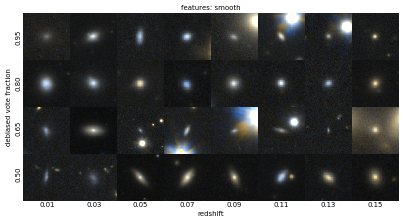

--------------------------------------------------------------------
features_features
-----------------


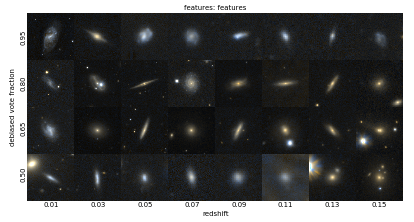

--------------------------------------------------------------------
features_star_or_artifact
-------------------------


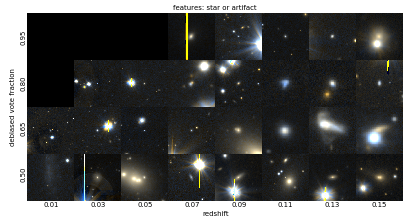

--------------------------------------------------------------------
edgeon_yes
----------


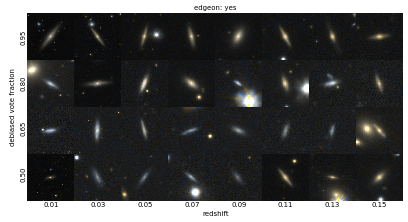

--------------------------------------------------------------------
edgeon_no
---------


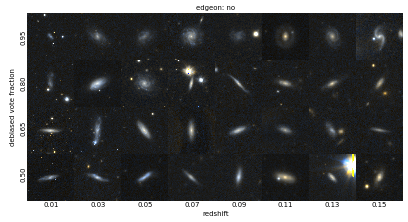

--------------------------------------------------------------------
bar_bar
-------


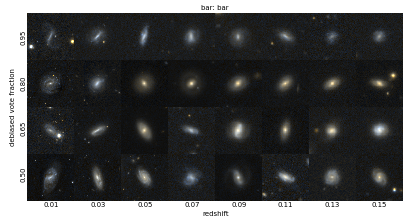

--------------------------------------------------------------------
bar_no_bar
----------


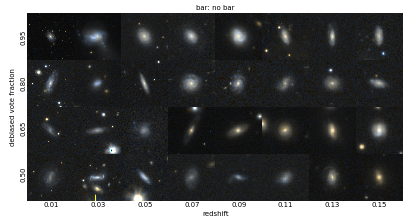

--------------------------------------------------------------------
spiral_spiral
-------------


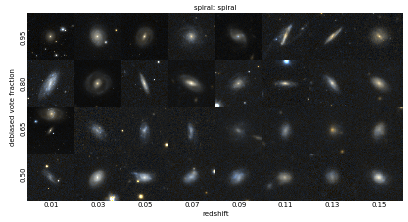

--------------------------------------------------------------------
spiral_no_spiral
----------------


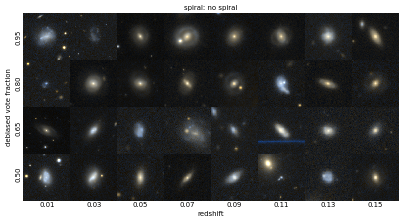

--------------------------------------------------------------------
bulge_no_bulge
--------------


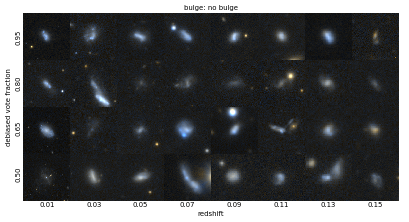

--------------------------------------------------------------------
bulge_obvious
-------------


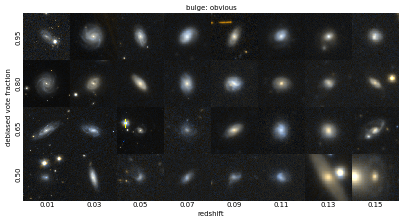

--------------------------------------------------------------------
bulge_dominant
--------------


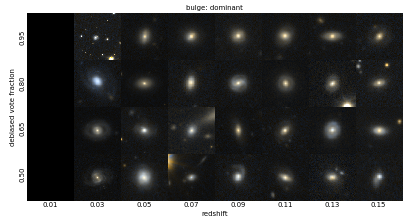

--------------------------------------------------------------------
spiralwinding_tight
-------------------


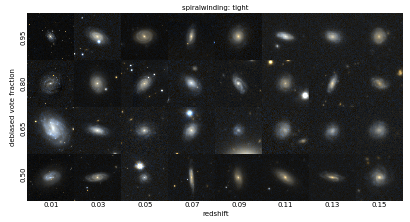

--------------------------------------------------------------------
spiralwinding_medium
--------------------


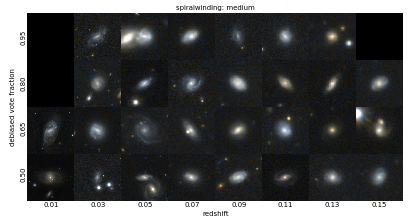

--------------------------------------------------------------------
spiralwinding_loose
-------------------


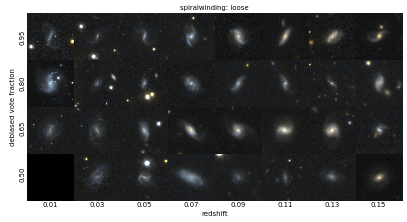

--------------------------------------------------------------------
spiralnumber_1
--------------


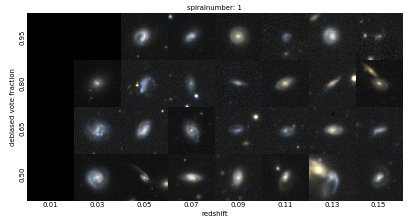

--------------------------------------------------------------------
spiralnumber_2
--------------


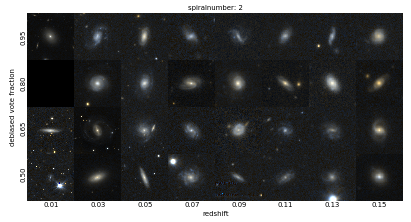

--------------------------------------------------------------------
spiralnumber_3
--------------


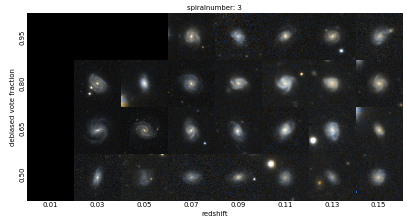

--------------------------------------------------------------------
spiralnumber_4
--------------


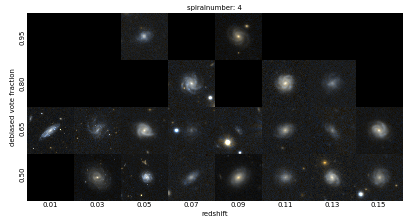

--------------------------------------------------------------------
spiralnumber_more_than_4
------------------------


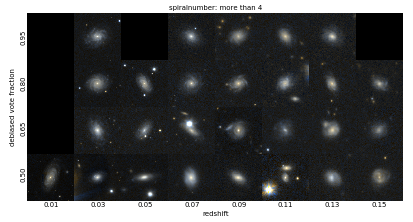

--------------------------------------------------------------------
bulgeshape_rounded
------------------


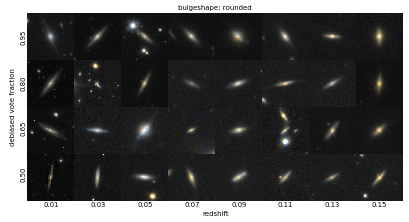

--------------------------------------------------------------------
bulgeshape_boxy
---------------


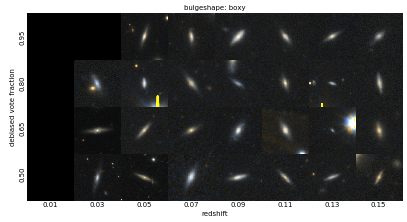

--------------------------------------------------------------------
bulgeshape_no_bulge
-------------------


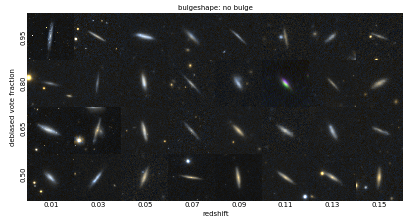

--------------------------------------------------------------------
round_completely_round
----------------------


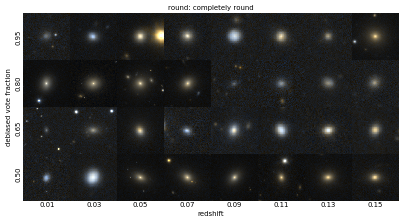

--------------------------------------------------------------------
round_in_between
----------------


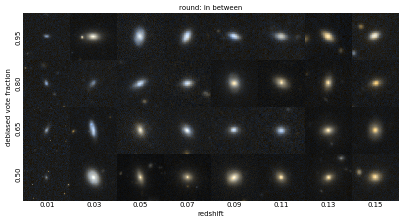

--------------------------------------------------------------------
round_cigar_shaped
------------------


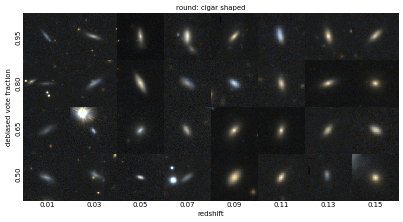

--------------------------------------------------------------------
mergers_merging
---------------


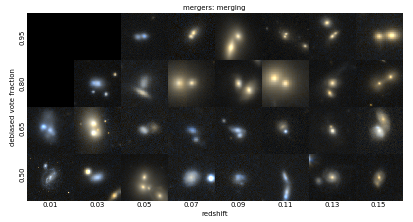

--------------------------------------------------------------------
mergers_tidal_debris
--------------------


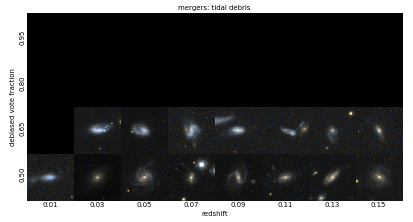

--------------------------------------------------------------------
mergers_both
------------


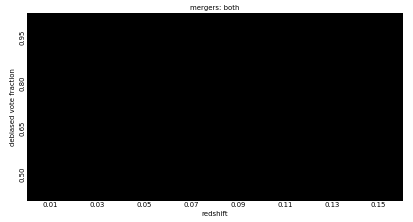

--------------------------------------------------------------------
mergers_neither
---------------


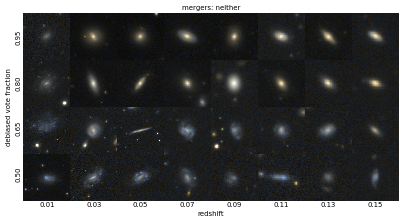

--------------------------------------------------------------------
oddtype_none
------------


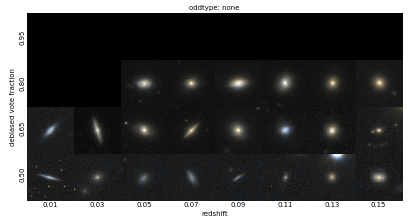

--------------------------------------------------------------------
oddtype_ring
------------


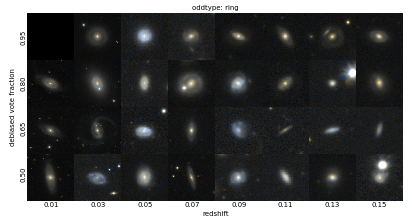

--------------------------------------------------------------------
oddtype_lens_or_arc
-------------------


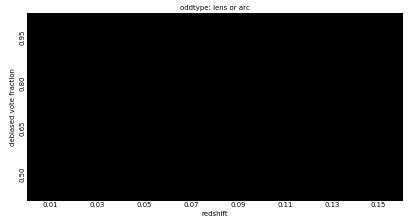

--------------------------------------------------------------------
oddtype_irregular
-----------------


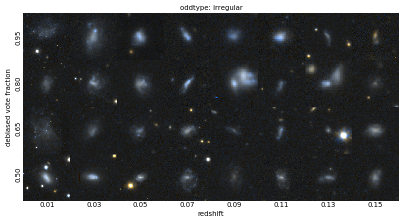

--------------------------------------------------------------------
oddtype_other
-------------


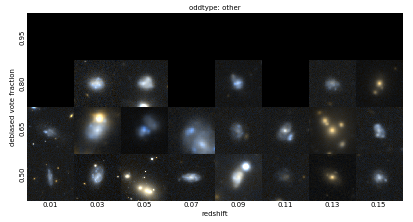

--------------------------------------------------------------------
oddtype_dust_lane
-----------------


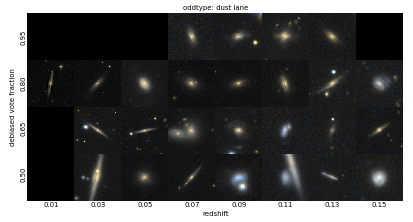

--------------------------------------------------------------------
oddtype_overlapping
-------------------


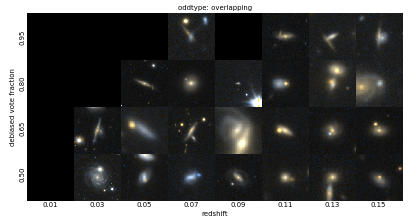

--------------------------------------------------------------------
discuss_yes
-----------


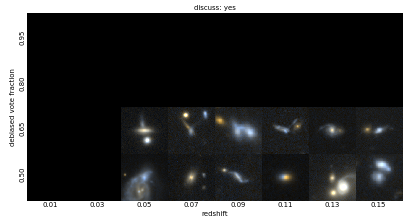

--------------------------------------------------------------------
discuss_no
----------


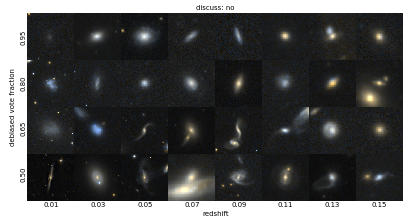

In [9]:
# VFZ: make VF-Z plots
fontsize = 6
inset = 0.05
color = 'red'
show_debug_text = False
for qa, qa_list in zip(qas, vfz_cataids):
    print('-'*68)
    print(qa)
    print('-'*len(qa))
    fig, axs = plt.subplots(len(vf_mids), len(z_mids),
                            figsize=(8,4.36), dpi=50,
                            gridspec_kw = {'wspace':0, 'hspace':0})
    for ax, cataid in zip(np.ravel(axs.T), np.ravel(qa_list)):
        img = f'{pngdir}/G{cataid}-native.png'
        if os.path.exists(img):
            im = matplotlib.image.imread(img)
        else:
            im = np.array([[[0,0,0]]])
        ax.imshow(im)
        ax.axis('off')
        if os.path.exists(img):
            row = np.where(dat['CATAID'] == cataid)[0][0]
            cc = dat[row][f'{qa}_clean_frac']
            dd = dat[row][f'{qa}_deb_frac']
            zz = dat[row]['Z_TONRY']
            if show_debug_text:
                ax.text(inset,1-inset,f'{cataid}',color=color,
                        transform=ax.transAxes, va='top',
                        ha='left', fontsize=fontsize)
                ax.text(1-inset,1-inset,f'{zz:0.3f}',color=color,
                        transform=ax.transAxes, va='top',
                        ha='right', fontsize=fontsize)
                ax.text(inset,inset,f'{cc:0.2f}',color=color,
                        transform=ax.transAxes, va='bottom',
                        ha='left', fontsize=fontsize)
                ax.text(1-inset,inset,f'{dd:0.2f}',color=color,
                        transform=ax.transAxes, va='bottom',
                        ha='right', fontsize=fontsize)
    # axes labelling
    qa_bits = qa.split('_')
    qq = f'{qa_bits[0]}'
    aa = ' '.join(qa_bits[1:])
    plt.text(0.52, 0.965, f'{qq}: {aa}',
            transform=fig.transFigure, ha='center')
    plt.text(0.52, 0.02, f'redshift',
             transform=fig.transFigure, ha='center')
    plt.text(0.008, 0.52, f'debiased vote fraction',
             transform=fig.transFigure, va='center', rotation=90)
    # redshift tick labels
    for xx, zz in zip(np.linspace(0.11,0.93,len(z_mids)),
                      z_mids):
        plt.text(xx, 0.06, f'{zz:.02f}',
                 transform=fig.transFigure, ha='center')
    # deb VF tick labels
    for yy, vv in zip(np.linspace(0.21,0.84,len(vf_mids)),
                      vf_mids[::-1]):
        plt.text(0.0325, yy, f'{vv:.02f}', rotation=90,
                 transform=fig.transFigure, va='center')
    #plt.tight_layout()
    fig.subplots_adjust(left=0.05, right=0.99,
                        bottom=0.09, top=0.95)
    plt.savefig(fname=f'{vfzdir}/vfz_{qa}.png', dpi=300)
    plt.show()  # comment out to reduce saved notebook size
    plt.close()

## Debiased vs Cleaned Vote Fraction Plots

In [10]:
def kde2d(x, y, xlim = None, ylim = None, nx = 25, ny = 25,
          sigma = None, xlog = False, ylog = False,
          levels = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]):
    """2D kernel density estimator."""
    old = np.seterr(invalid='ignore')
    xlim = [np.nanmin(x), np.nanmax(x)] if xlim is None else xlim
    ylim = [np.nanmin(y), np.nanmax(y)] if ylim is None else ylim
    if xlog:
        x = np.log10(x)
        xlim = np.log10(xlim)
    if ylog:
        y = np.log10(y)
        ylim = np.log10(ylim)
    bins = [int(nx), int(ny)]
    Z, X, Y = np.histogram2d(x, y, bins, [xlim, ylim])
    if xlog:
        X = 10**X
    if ylog:
        Y = 10**Y
    X = (X[1:] + X[:-1]) / 2
    Y = (Y[1:] + Y[:-1]) / 2
    sigma=[np.sqrt(nx)/5,np.sqrt(ny)/5] if sigma is None else sigma
    Z = gaussian_filter(Z, sigma)
    L = []
    if levels:
        V = sorted(np.ravel(Z))
        C = np.cumsum(V)
        for lvl in levels:
            L.append(V[np.abs(C - (C[-1]*lvl)).argmin()])
    np.seterr(**old)
    return X, Y, Z.T, [xlim, ylim], L

In [11]:
# FCFD: generate PNG list
bw = 0.1
# fc_bins = seq(0, 1, bw)
# fd_bins = seq(0, 1, bw)
# fc_mids = np.median([fc_bins[:-1], fc_bins[1:]], axis=0)
# fd_mids = np.median([fd_bins[:-1], fd_bins[1:]], axis=0)
fc_mids = seq(0, 1, bw)
fd_mids = seq(0, 1, bw)
fcfd_cataids = []
for qa in qas:
    qq  = qa.split('_')[0]
    psamp = dat[f'{qq}_deb_psamp']
    samp = (goods & psamp)
    vf_cln = dat[f'{qa}_clean_frac'][samp]
    vf_deb = dat[f'{qa}_deb_frac'][samp]
    cataids = dat['CATAID'][samp]
    qa_cataids = []
    for fc in fc_mids:
        for fd in fd_mids[::-1]:
            vfc_off = vf_cln - fc
            vfd_off = vf_deb - fd
            offset = np.sqrt((vfc_off**2) + (vfd_off**2))
            subsamp = ((np.abs(vfc_off) <= (bw/2))
                       & (np.abs(vfd_off) <= (bw/2)))
            if np.any(subsamp):
                row = np.argmin(offset[subsamp])
                qa_cataids.append(cataids[subsamp][row])
            else:
                qa_cataids.append(0)
    fcfd_cataids.append(qa_cataids)

In [12]:
# FCFD: get PNGS from the web
import requests
fcfd_cataids_flat = [item for sub in fcfd_cataids for item in sub]
fcfd_cataids_flat = np.unique(fcfd_cataids_flat)
fcfd_cataids_flat = [x for x in fcfd_cataids_flat if x != 0]
for ii, cataid in enumerate(fcfd_cataids_flat):
    print(f'\r{ii+1}/{len(fcfd_cataids_flat)}: {cataid}   ',
          end='', flush=True)
    row = np.where(dat['CATAID'] == cataid)[0][0]
    #webpng = dat[row]['URL_NATIVE_424']  # 424x424 pixel
    webpng = dat[row]['URL_NATIVE']  # natural resolution
    outpng = f'{pngdir}/G{cataid}-native.png'
    if not os.path.exists(outpng):
        r = requests.get(webpng, auth=(gamauser, gamapass))
        if r.status_code == 200:
            with open(outpng, 'wb') as out:
                for bits in r.iter_content():
                    out.write(bits)

2073/2073: 4327300   

In [13]:
# # FCFD v1: make plots
# fontsize = 5
# inset = 0.05
# color = 'red'
# for qa, qa_list in zip(qas, fcfd_cataids):
#     print('-'*68)
#     print(qa)
#     print('-'*len(qa))
#     fig, axs = plt.subplots(len(fc_mids), len(fd_mids),
#                             figsize=(8,8.175), dpi=50,
#                             gridspec_kw = {'wspace':0, 'hspace':0})
#     for ax, cataid in zip(np.ravel(axs.T), np.ravel(qa_list)):
#         img = f'{pngdir}/G{cataid}-native.png'
#         if os.path.exists(img):
#             im = matplotlib.image.imread(img)
#         else:
#             im = np.array([[[0,0,0]]])
#         ax.imshow(im)
#         ax.axis('off')
#         if os.path.exists(img):
#             row = np.where(dat['CATAID'] == cataid)[0][0]
#             cc = dat[row][f'{qa}_clean_frac']
#             dd = dat[row][f'{qa}_deb_frac']
#             zz = dat[row]['Z_TONRY']
#             ax.text(inset,1-inset,f'{cataid}',color=color,
#                     transform=ax.transAxes, va='top', ha='left',
#                     fontsize=fontsize)
#             ax.text(1-inset,1-inset,f'{zz:0.3f}',color=color,
#                     transform=ax.transAxes, va='top', ha='right',
#                     fontsize=fontsize)
#             ax.text(inset,inset,f'{cc:0.2f}',color=color,
#                     transform=ax.transAxes, va='bottom', ha='left',
#                     fontsize=fontsize)
#             ax.text(1-inset,inset,f'{dd:0.2f}',color=color,
#                     transform=ax.transAxes, va='bottom', ha='right',
#                     fontsize=fontsize)
#     # axes labelling
#     qa_bits = qa.split('_')
#     qq = f'{qa_bits[0]}'
#     aa = ' '.join(qa_bits[1:])
#     plt.text(0.522, 0.978, f'{qq}: {aa}',
#             transform=fig.transFigure, ha='center')
#     plt.text(0.522, 0.008, f'cleaned vote fraction',
#              transform=fig.transFigure, ha='center')
#     plt.text(0.008, 0.52, f'debiased vote fraction',
#              transform=fig.transFigure, va='center', rotation=90)
#     # cleaned VF tick labels
#     for xx, cc in zip(np.linspace(0.0925,0.95,len(fc_mids)),
#                       fc_mids):
#         plt.text(xx, 0.03, f'{cc:.01f}',
#                  transform=fig.transFigure, ha='center')
#     # debiased VF tick labels
#     for yy, dd in zip(np.linspace(0.0925,0.93,len(fd_mids)),
#                       fd_mids):
#         plt.text(0.0325, yy, f'{dd:.01f}', rotation=90,
#                  transform=fig.transFigure, va='center')
#     #plt.tight_layout()
#     fig.subplots_adjust(left=0.05, right=0.99,
#                         bottom=0.05, top=0.97)
#     plt.savefig(fname=f'{fcfddir}/fcfd_{qa}.png', dpi=300)
#     plt.show()  # comment out to reduce saved notebook size
#     plt.close()

In [14]:
# z to dist
def z_to_dist(z):
    cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
    return cosmo.luminosity_distance(z)

In [15]:
# mag to Mag
def mag_to_Mag(mag, z):
    D = z_to_dist(z)
    Mag = mag - 5*(np.log10(D/(u.pc))-1)
    return Mag

--------------------------------------------------------------------
features_smooth
---------------


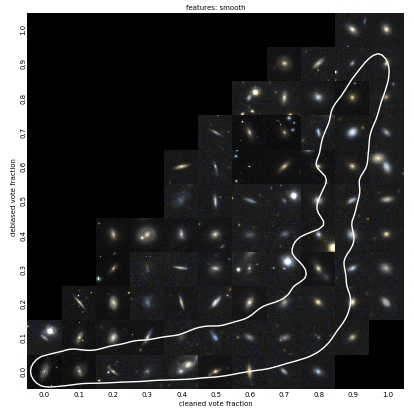

--------------------------------------------------------------------
features_features
-----------------


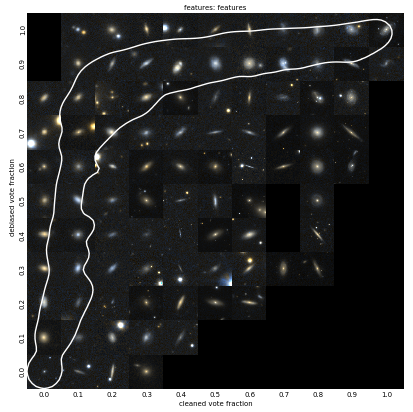

--------------------------------------------------------------------
features_star_or_artifact
-------------------------


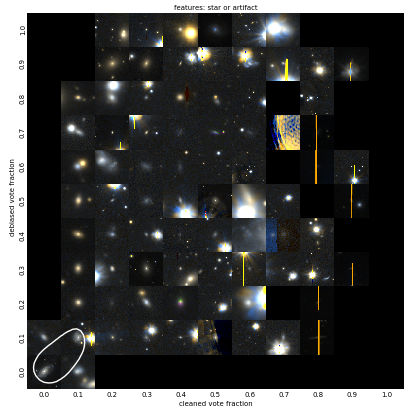

--------------------------------------------------------------------
edgeon_yes
----------


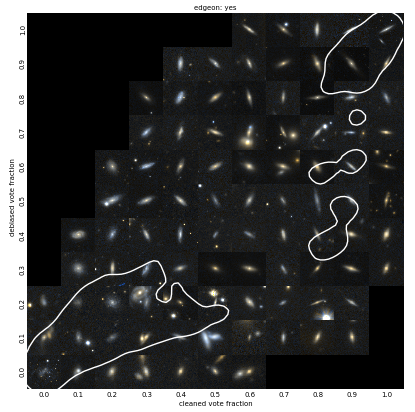

--------------------------------------------------------------------
edgeon_no
---------


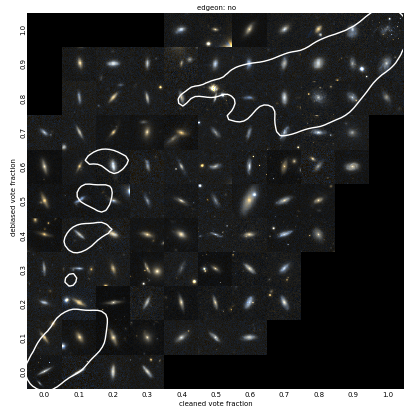

--------------------------------------------------------------------
bar_bar
-------


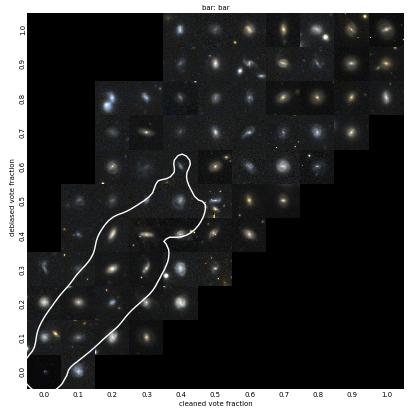

--------------------------------------------------------------------
bar_no_bar
----------


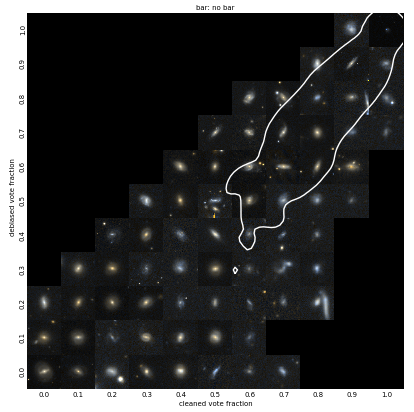

--------------------------------------------------------------------
spiral_spiral
-------------


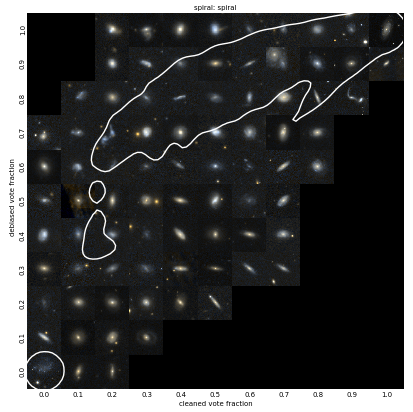

--------------------------------------------------------------------
spiral_no_spiral
----------------


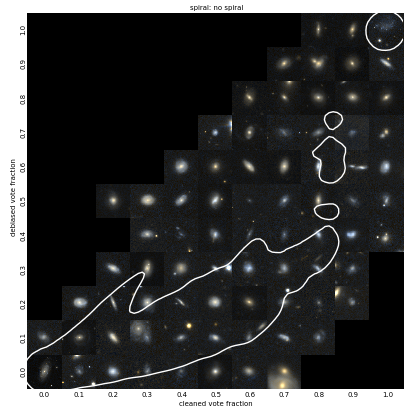

--------------------------------------------------------------------
bulge_no_bulge
--------------


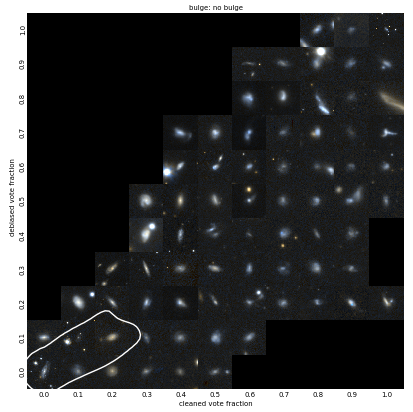

--------------------------------------------------------------------
bulge_obvious
-------------


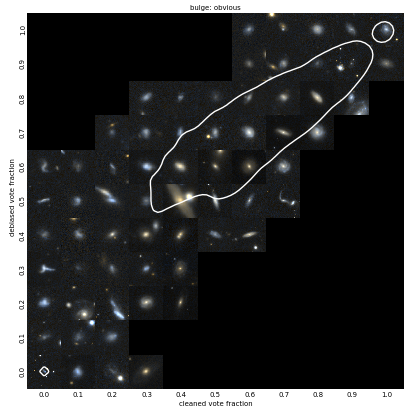

--------------------------------------------------------------------
bulge_dominant
--------------


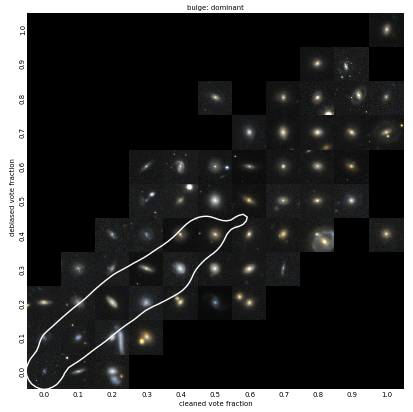

--------------------------------------------------------------------
spiralwinding_tight
-------------------


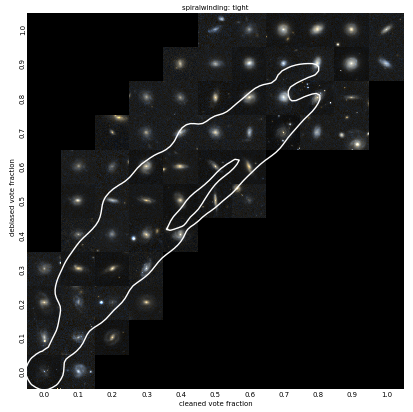

--------------------------------------------------------------------
spiralwinding_medium
--------------------


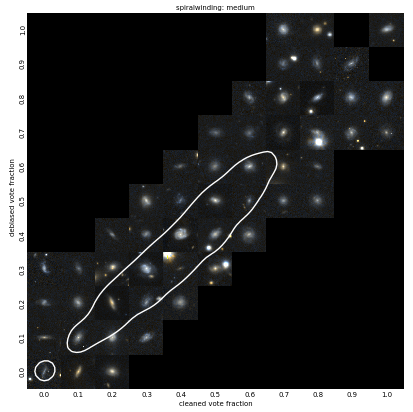

--------------------------------------------------------------------
spiralwinding_loose
-------------------


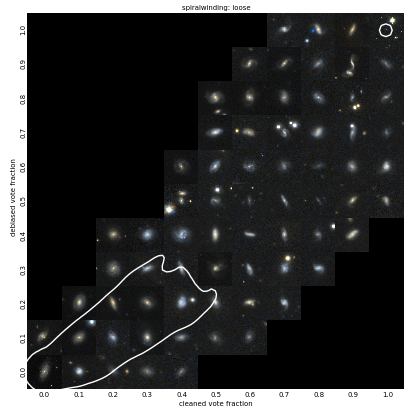

--------------------------------------------------------------------
spiralnumber_1
--------------


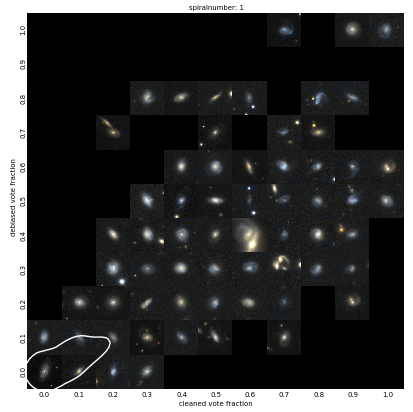

--------------------------------------------------------------------
spiralnumber_2
--------------


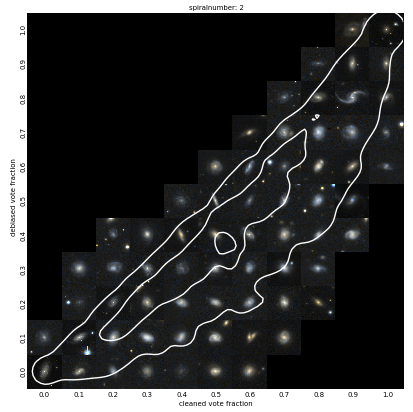

--------------------------------------------------------------------
spiralnumber_3
--------------


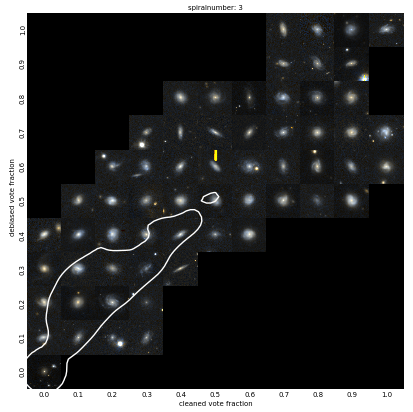

--------------------------------------------------------------------
spiralnumber_4
--------------


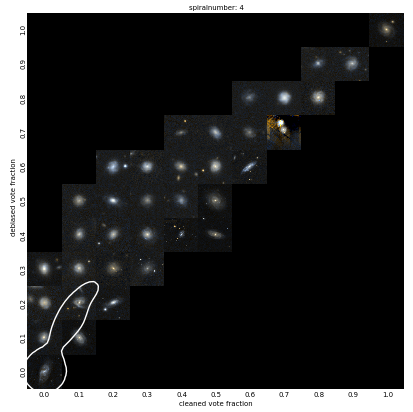

--------------------------------------------------------------------
spiralnumber_more_than_4
------------------------


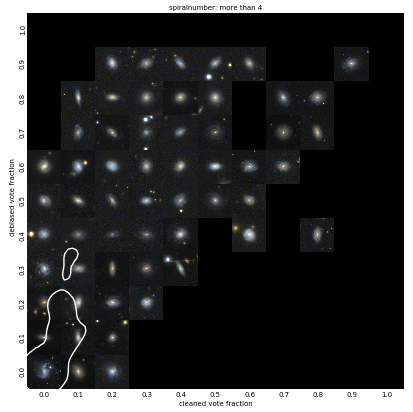

--------------------------------------------------------------------
bulgeshape_rounded
------------------


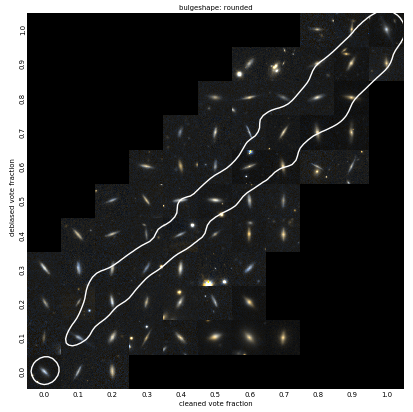

--------------------------------------------------------------------
bulgeshape_boxy
---------------


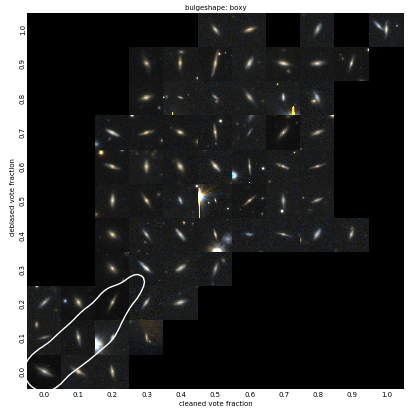

--------------------------------------------------------------------
bulgeshape_no_bulge
-------------------


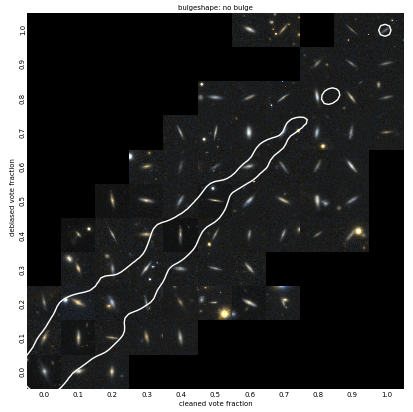

--------------------------------------------------------------------
round_completely_round
----------------------


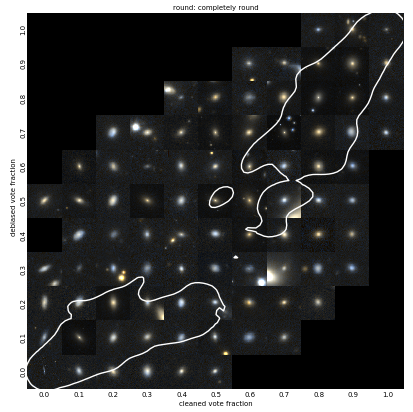

--------------------------------------------------------------------
round_in_between
----------------


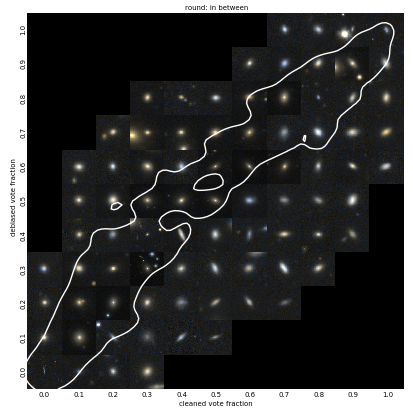

--------------------------------------------------------------------
round_cigar_shaped
------------------


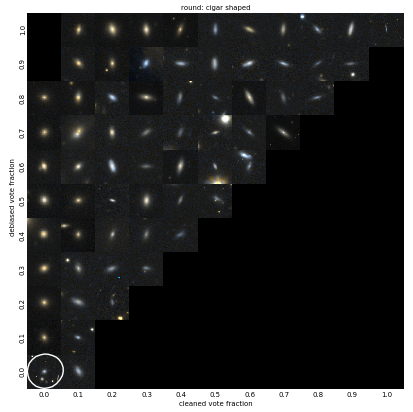

--------------------------------------------------------------------
mergers_merging
---------------


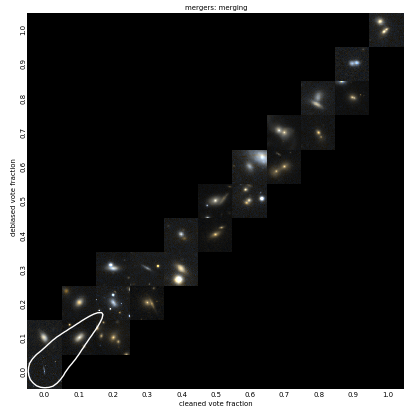

--------------------------------------------------------------------
mergers_tidal_debris
--------------------


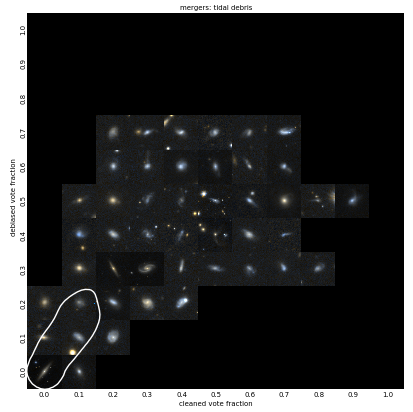

--------------------------------------------------------------------
mergers_both
------------


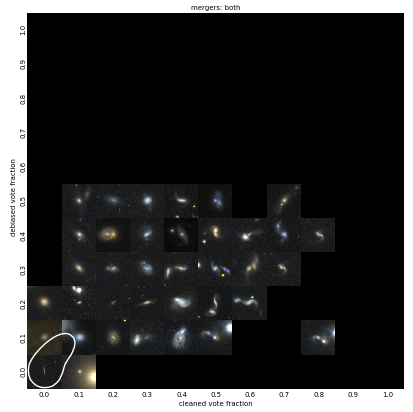

--------------------------------------------------------------------
mergers_neither
---------------


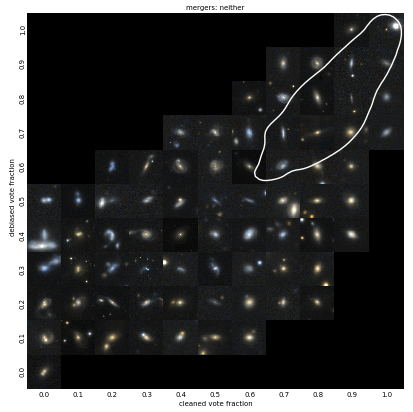

--------------------------------------------------------------------
oddtype_none
------------


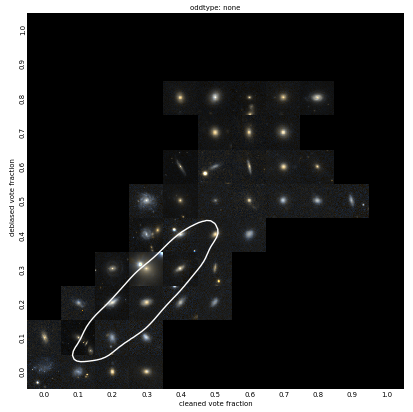

--------------------------------------------------------------------
oddtype_ring
------------


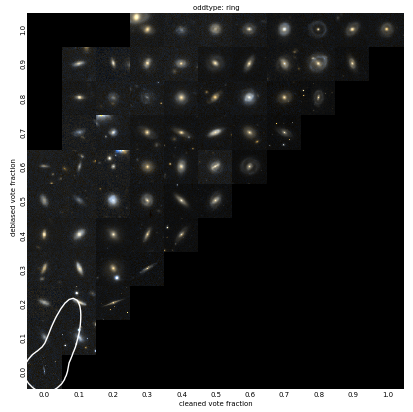

--------------------------------------------------------------------
oddtype_lens_or_arc
-------------------


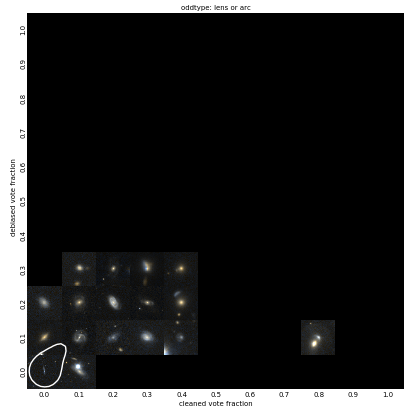

--------------------------------------------------------------------
oddtype_irregular
-----------------


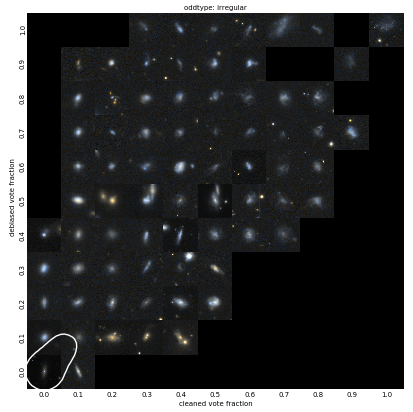

--------------------------------------------------------------------
oddtype_other
-------------


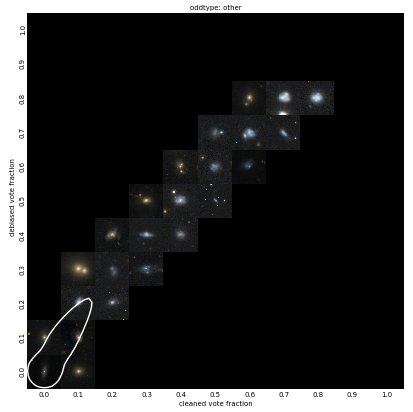

--------------------------------------------------------------------
oddtype_dust_lane
-----------------


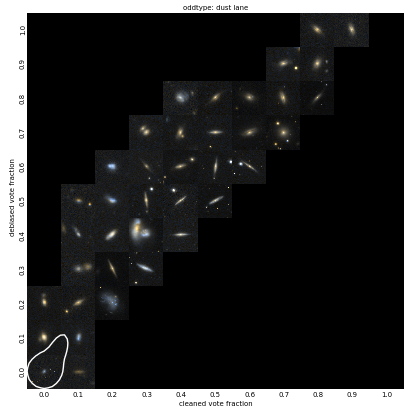

--------------------------------------------------------------------
oddtype_overlapping
-------------------


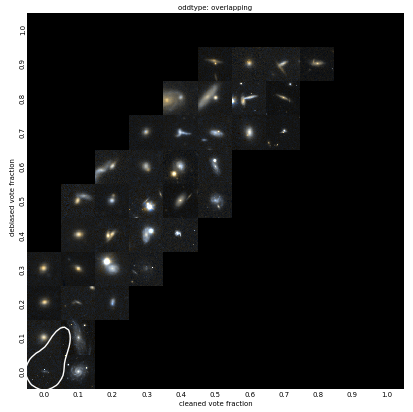

--------------------------------------------------------------------
discuss_yes
-----------


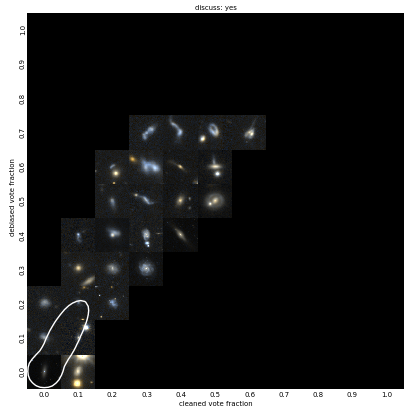

--------------------------------------------------------------------
discuss_no
----------


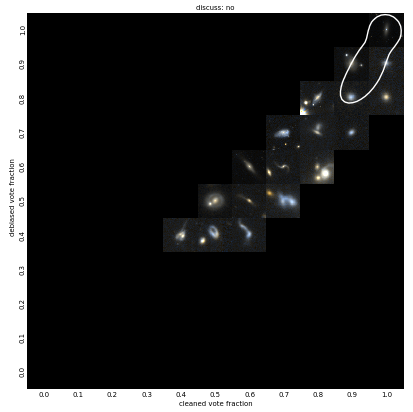

In [16]:
# FCFD v2: make plots
fontsize = 5
inset = 0.05
color = 'red'
show_debug_text = False

survey_mag_limit = 19.8
volume_redshift_bounds = (0.02, 0.15)
z = dat['Z_TONRY']
Mr = dat['absmag_r']
MagComplete = mag_to_Mag(survey_mag_limit,
                         np.max(volume_redshift_bounds))
in_vl = ((z >= volume_redshift_bounds[0]) &
         (z <= volume_redshift_bounds[1]) &
         (Mr > -99) & (Mr <= MagComplete))

for qa, qa_list in zip(qas, fcfd_cataids):
    qa_bits = qa.split('_')
    qq = f'{qa_bits[0]}'
    aa = ' '.join(qa_bits[1:])
    print('-'*68)
    print(qa)
    print('-'*len(qa))
    fig, axs = plt.subplots(len(fc_mids), len(fd_mids),
                            figsize=(8,8.175), dpi=50,
                            gridspec_kw = {'wspace':0, 'hspace':0})
    for ax, cataid in zip(np.ravel(axs.T), np.ravel(qa_list)):
        img = f'{pngdir}/G{cataid}-native.png'
        if os.path.exists(img):
            im = matplotlib.image.imread(img)
        else:
            im = np.array([[[0,0,0]]])
        ax.imshow(im)
        ax.axis('off')
        if os.path.exists(img):
            row = np.where(dat['CATAID'] == cataid)[0][0]
            cc = dat[row][f'{qa}_clean_frac']
            dd = dat[row][f'{qa}_deb_frac']
            zz = dat[row]['Z_TONRY']
            if show_debug_text:
                ax.text(inset,1-inset,f'{cataid}',color=color,
                        transform=ax.transAxes,
                        va='top', ha='left',
                        fontsize=fontsize)
                ax.text(1-inset,1-inset,f'{zz:0.3f}',color=color,
                        transform=ax.transAxes,
                        va='top', ha='right',
                        fontsize=fontsize)
                ax.text(inset,inset,f'{cc:0.2f}',color=color,
                        transform=ax.transAxes,
                        va='bottom', ha='left',
                        fontsize=fontsize)
                ax.text(1-inset,inset,f'{dd:0.2f}',color=color,
                        transform=ax.transAxes,
                        va='bottom', ha='right',
                        fontsize=fontsize)
    # add uber axis
    gpad = 0.1  # kde2d gridding padding
    ppad = 0.05  # plotting x/y limit padding
    big_ax = fig.add_subplot(111, facecolor='None')
    vfc = dat[f'{qa}_clean_frac']
    vfd = dat[f'{qa}_deb_frac']
    qa_good = ((vfd>=0)&(vfd<=1)&(vfc>=0)&(vfc<=1)&in_vl)
    qa_good &= dat[f'{qq}_deb_psamp']
    X, Y, Z, extent, L = kde2d(vfc[qa_good], vfd[qa_good],
                               xlim=(0-gpad,1+gpad),
                               ylim=(0-gpad,1+gpad),
                               nx=101, ny=101,
                               levels=[0.25])
    #big_ax.scatter(vfc[qa_good], vfd[qa_good])    
    big_ax.contour(X, Y, Z, L, alpha=1,
                   linewidths=2, colors='white')
    #big_ax.contour(X, Y, Z, L, alpha=0.5,
    #               linewidths=2, cmap='viridis')
    big_ax.set_xlim((0-ppad,1+ppad))
    big_ax.set_ylim((0-ppad,1+ppad))
    big_ax.axis('off')
    # axes labelling
    plt.text(0.522, 0.978, f'{qq}: {aa}',
            transform=fig.transFigure, ha='center')
    plt.text(0.522, 0.008, f'cleaned vote fraction',
             transform=fig.transFigure, ha='center')
    plt.text(0.008, 0.52, f'debiased vote fraction',
             transform=fig.transFigure, va='center', rotation=90)
    # cleaned VF tick labels
    for xx, cc in zip(np.linspace(0.0925,0.95,len(fc_mids)),
                      fc_mids):
        plt.text(xx, 0.03, f'{cc:.01f}',
                 transform=fig.transFigure, ha='center')
    # debiased VF tick labels
    for yy, dd in zip(np.linspace(0.0925,0.93,len(fd_mids)),
                      fd_mids):
        plt.text(0.0325, yy, f'{dd:.01f}', rotation=90,
                 transform=fig.transFigure, va='center')
    #plt.tight_layout()
    fig.subplots_adjust(left=0.05, right=0.99,
                        bottom=0.05, top=0.97)
    plt.savefig(fname=f'{fcfddir}/fcfd_{qa}.png', dpi=300,
                transparent=False)
    plt.show()  # comment out to reduce saved notebook size
    plt.close()

In [17]:
# remove temporary PNG files after processing
cmd = f'rm -R {pngdir}'
!{cmd}

In [18]:
# Notebook finish up
nbt1, nbt1str = timecheck(nbt0)
print(f'Notebook end time:\n   {nbt1str}')
#--------------------------------68-------------------------------->

Notebook end time:
   2020-12-09 20:47:22 CST (elapsed: 00:04:07)
